In [3]:
!git clone https://github.com/jantic/DeOldify.git DeOldify

Cloning into 'DeOldify'...
remote: Enumerating objects: 16, done.
remote: Counting objects: 100% (16/16), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 2083 (delta 4), reused 5 (delta 1), pack-reused 2067
Receiving objects: 100% (2083/2083), 69.34 MiB | 20.82 MiB/s, done.
Resolving deltas: 100% (930/930), done.


In [4]:
cd DeOldify

/content/DeOldify


In [5]:
from deoldify import device
from deoldify.device_id import DeviceId
device.set(device=DeviceId.GPU0)
import torch
if not torch.cuda.is_available():
    print('GPU not available.')

In [6]:
!pip install -r colab_requirements.txt

     |████████████████████████████████| 215kB 7.2MB/s 
     |████████████████████████████████| 133kB 13.0MB/s 
     |████████████████████████████████| 1.8MB 14.5MB/s 
     |████████████████████████████████| 7.6MB 28.2MB/s 
     |████████████████████████████████| 61kB 8.3MB/s 
  Created wheel for ffmpeg: filename=ffmpeg-1.4-cp36-none-any.whl size=6084 sha256=b5fe394df0831a25492b55aae401d5693f2e574937e1368daf3d5d4e1d7130f1
  Stored in directory: /root/.cache/pip/wheels/b6/68/c3/a05a35f647ba871e5572b9bbfc0b95fd1c6637a2219f959e7a
Successfully built ffmpeg
  Found existing installation: fastai 1.0.61
    Uninstalling fastai-1.0.61:
      Successfully uninstalled fastai-1.0.61
  Found existing installation: jsonschema 2.6.0
    Uninstalling jsonschema-2.6.0:
      Successfully uninstalled jsonschema-2.6.0


In [7]:
import fastai
from deoldify.visualize import *
torch.backends.cudnn.benchmark = True

In [8]:
!mkdir 'models'
!wget https://www.dropbox.com/s/mwjep3vyqk5mkjc/ColorizeStable_gen.pth?dl=0 -O ./models/ColorizeStable_gen.pth

--2020-06-27 11:47:03--  https://www.dropbox.com/s/mwjep3vyqk5mkjc/ColorizeStable_gen.pth?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.67.1, 2620:100:6023:1::a27d:4301
Connecting to www.dropbox.com (www.dropbox.com)|162.125.67.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/mwjep3vyqk5mkjc/ColorizeStable_gen.pth [following]
--2020-06-27 11:47:04--  https://www.dropbox.com/s/raw/mwjep3vyqk5mkjc/ColorizeStable_gen.pth
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc06fbbb1525d6919698f92d5eb0.dl.dropboxusercontent.com/cd/0/inline/A6fCUlKEjr7m9Wy6aafvw_dboaMHpWE3SZhbzx7V5IQ42xI4VifZngyVngh0G-0GkeYj-N70JcqeayqRSeAGh42QIVcXd-uIw6VWtux1bF_-7w/file# [following]
--2020-06-27 11:47:04--  https://uc06fbbb1525d6919698f92d5eb0.dl.dropboxusercontent.com/cd/0/inline/A6fCUlKEjr7m9Wy6aafvw_dboaMHpWE3SZhbzx7V5IQ42xI4VifZngyVngh0G-0GkeYj-N70JcqeayqRSeAGh42QIVcXd-uIw

In [11]:
!mkdir 'models'
!wget https://www.dropbox.com/s/336vn9y4qwyg9yz/ColorizeVideo_gen.pth?dl=0 -O ./models/ColorizeVideo_gen.pth

mkdir: cannot create directory ‘models’: File exists
--2020-06-27 11:49:47--  https://www.dropbox.com/s/336vn9y4qwyg9yz/ColorizeVideo_gen.pth?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.67.1, 2620:100:6023:1::a27d:4301
Connecting to www.dropbox.com (www.dropbox.com)|162.125.67.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/336vn9y4qwyg9yz/ColorizeVideo_gen.pth [following]
--2020-06-27 11:49:48--  https://www.dropbox.com/s/raw/336vn9y4qwyg9yz/ColorizeVideo_gen.pth
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucf03a0e86fac1cb20165b9bfef1.dl.dropboxusercontent.com/cd/0/inline/A6eMZdiJjLn1x9eIJjuo8i8YTXM_mfI-Upyvlc7dDcB1-2tshmLPrtlASCI2k1QWfn9lQA2usZkMXWQU9bskxbWljb9zj3gsgLYheq_o3x8xTQ/file# [following]
--2020-06-27 11:49:48--  https://ucf03a0e86fac1cb20165b9bfef1.dl.dropboxusercontent.com/cd/0/inline/A6eMZdiJjLn1x9eIJjuo8i8YTXM_mfI-Upyvlc7dDcB1-2t

In [9]:
imagecolorizer = get_image_colorizer(artistic=False)

/usr/local/lib/python3.6/dist-packages/fastai/data_block.py:442: UserWarning: Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.
  warn("Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.")
/usr/local/lib/python3.6/dist-packages/fastai/data_block.py:445: UserWarning: Your validation set is empty. If this is by design, use `split_none()`
                 or pass `ignore_empty=True` when labelling to remove this warning.
  or pass `ignore_empty=True` when labelling to remove this warning.""")
Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/checkpoints/resnet101-5d3b4d8f.pth


In [12]:
videocolorizer = get_video_colorizer()

/usr/local/lib/python3.6/dist-packages/fastai/data_block.py:442: UserWarning: Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.
  warn("Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.")
/usr/local/lib/python3.6/dist-packages/fastai/data_block.py:445: UserWarning: Your validation set is empty. If this is by design, use `split_none()`
                 or pass `ignore_empty=True` when labelling to remove this warning.
  or pass `ignore_empty=True` when labelling to remove this warning.""")


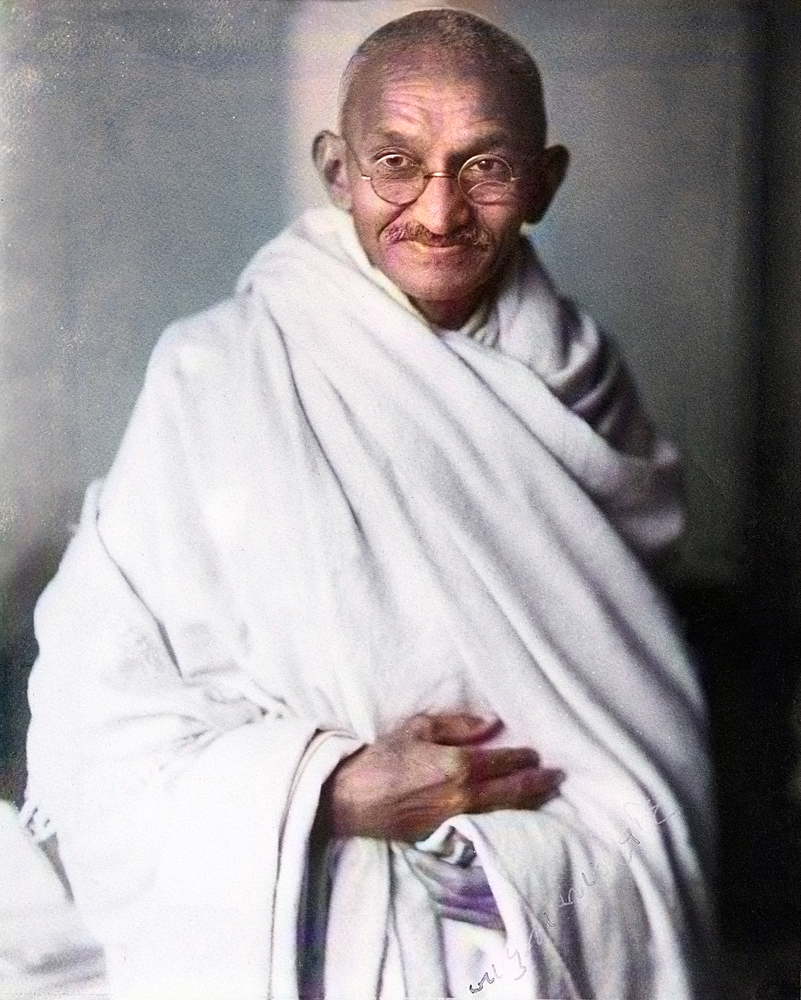

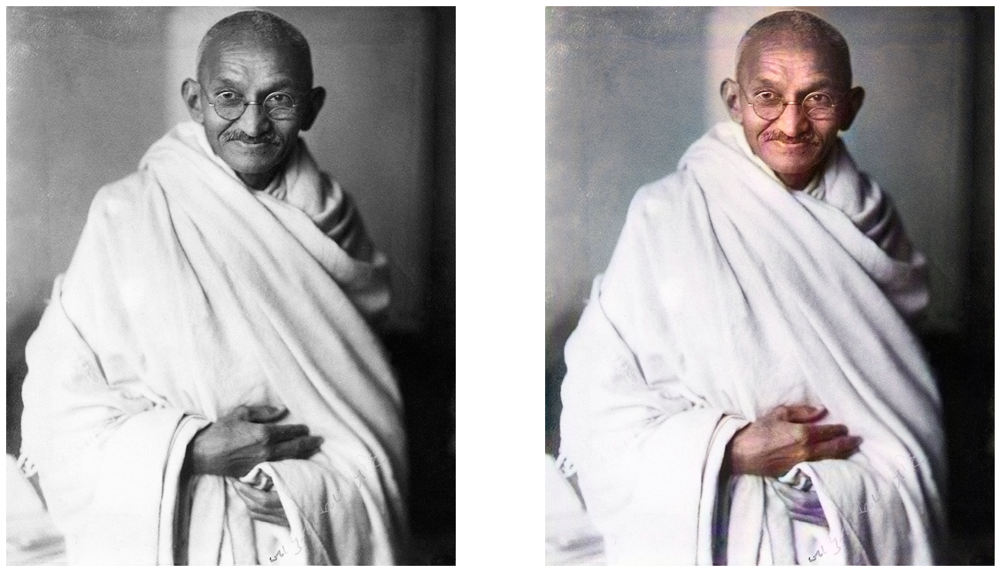

In [32]:
source_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/7/7a/Mahatma-Gandhi%2C_studio%2C_1931.jpg/1200px-Mahatma-Gandhi%2C_studio%2C_1931.jpg' #@param {type:"string"}
render_factor = 7  #@param {type: "slider", min: 7, max: 40}

if source_url is not None and source_url !='':
    image_path = imagecolorizer.plot_transformed_image_from_url(url=source_url, render_factor=render_factor, compare=True)
    show_image_in_notebook(image_path)
else:
    print('Provide an image url and try again.')

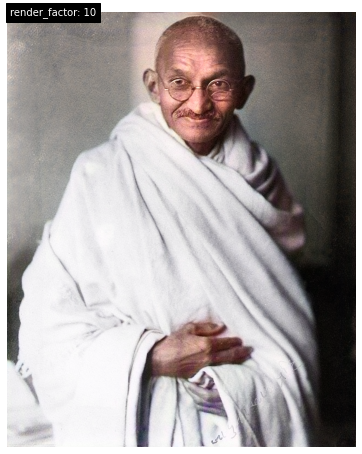

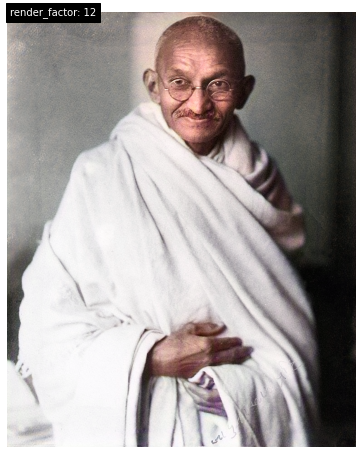

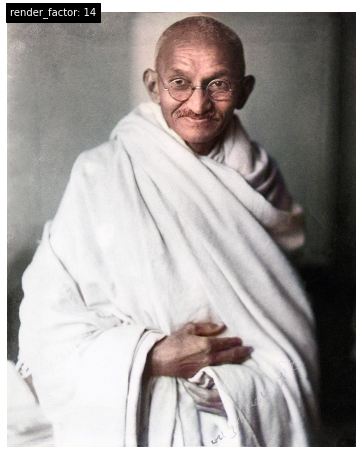

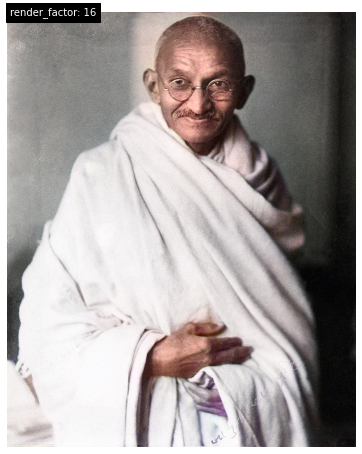

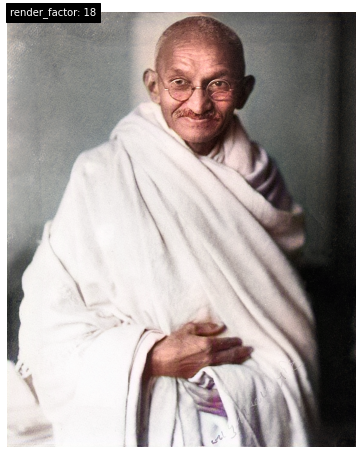

...

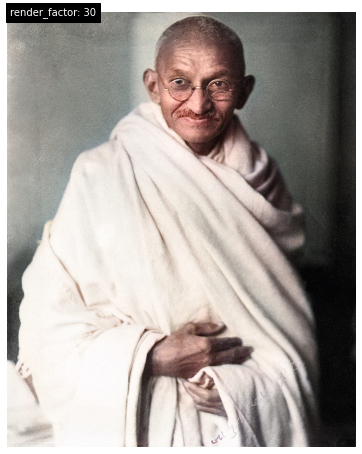

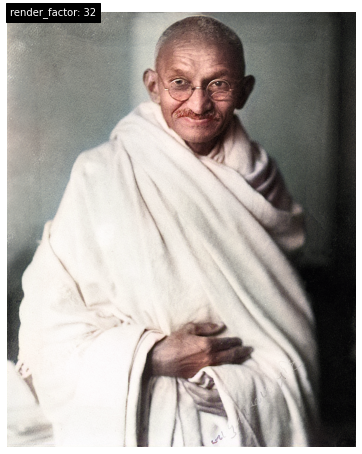

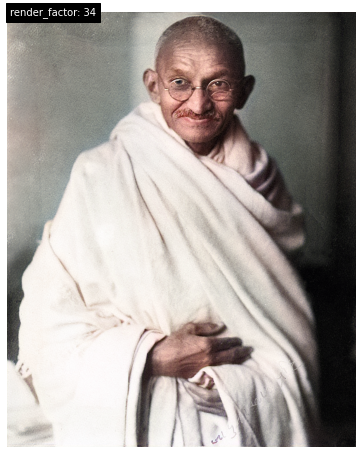

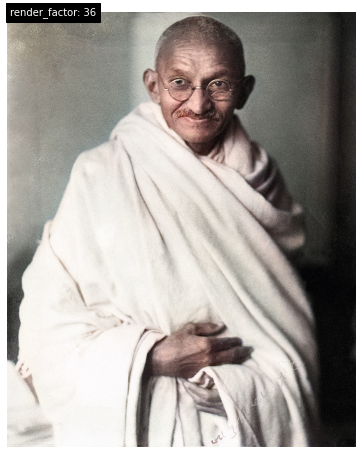

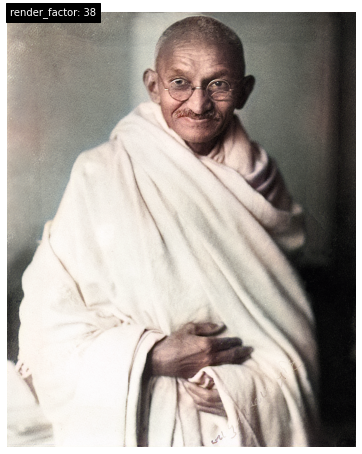

In [33]:
for i in range(10,40,2):
    imagecolorizer.plot_transformed_image('test_images/image.png', render_factor=i, display_render_factor=True, figsize=(8,8))

In [25]:
source_url = 'https://www.youtube.com/watch?v=P6njRwz_dMw' #@param {type:"string"}
render_factor = 10  #@param {type: "slider", min: 5, max: 40}

if source_url is not None and source_url !='':
    video_path = videocolorizer.colorize_from_url(source_url, 'video.mp4', render_factor)
    show_video_in_notebook(video_path)
else:
    print('Provide a video url and try again.')

[youtube] P6njRwz_dMw: Downloading webpage
[download] Destination: video/source/video.f135.mp4
[download] 100% of 20.38MiB in 00:00
[download] Destination: video/source/video.mp4.f140
[download] 100% of 3.18MiB in 00:00
[ffmpeg] Merging formats into "video/source/video.mp4"
Deleting original file video/source/video.f135.mp4 (pass -k to keep)
Deleting original file video/source/video.mp4.f140 (pass -k to keep)


Video created here: video/result/video.mp4


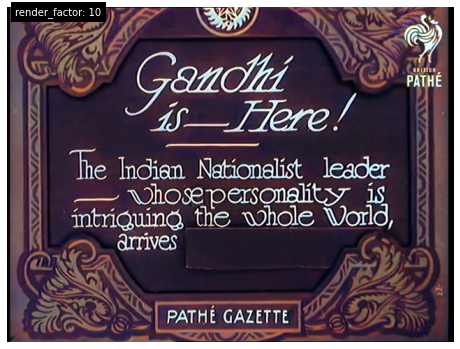

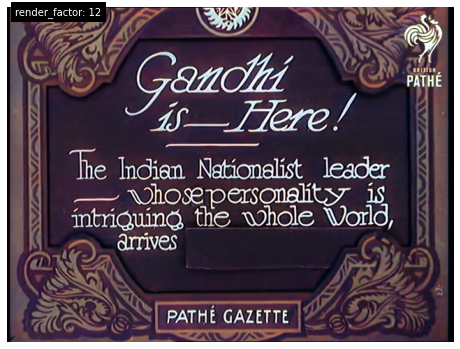

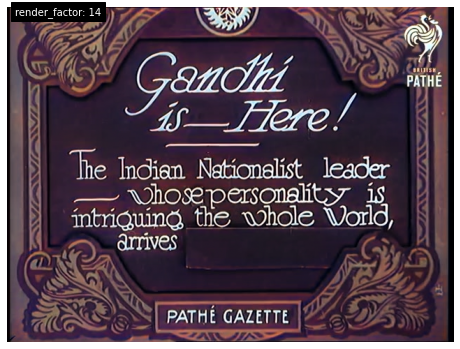

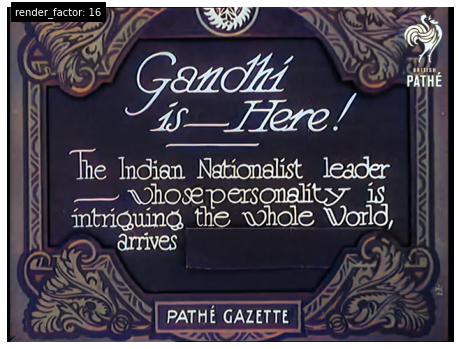

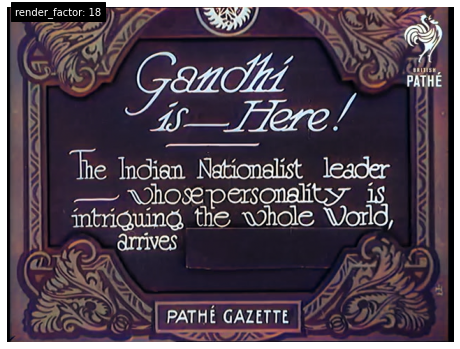

...

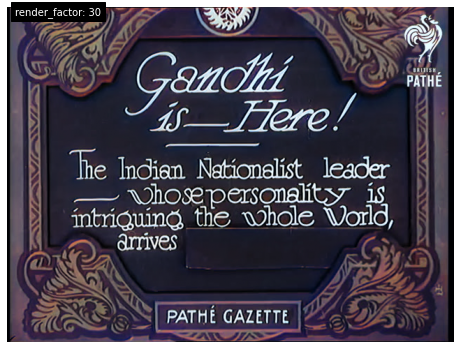

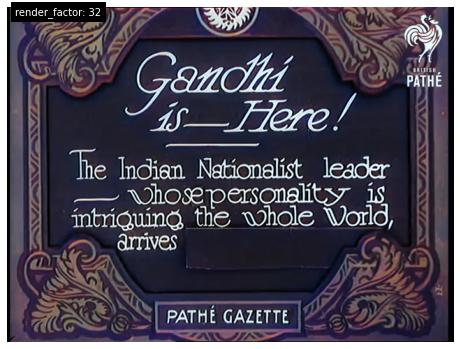

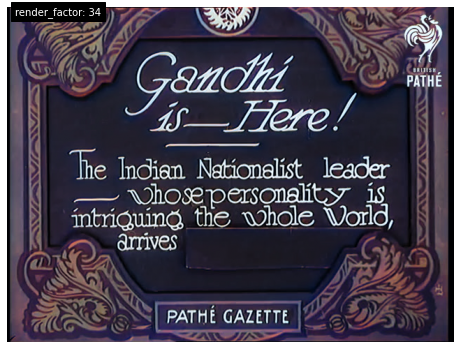

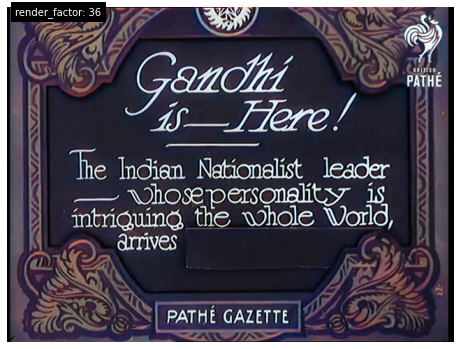

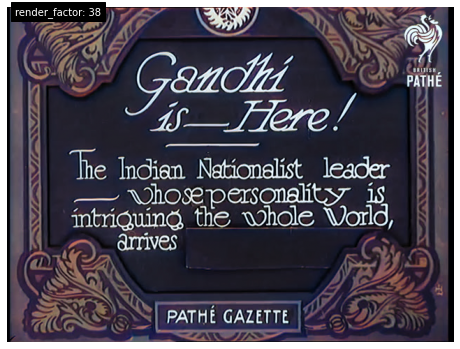

In [31]:
for i in range(10,40,2):
    videocolorizer.vis.plot_transformed_image('video/bwframes/video/00001.jpg', render_factor=i, display_render_factor=True, figsize=(8,8))